In [1]:
# !pip install fiftyone plotly numpy

In [2]:
import fiftyone as fo
import plotly.express as px
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
dataset_dir = "../data/opensource-dataset/data/"
annotation_path = "../data/opensource-dataset/labels.json"
dataset_name = "dogs-dataset"

if fo.dataset_exists(dataset_name):
    fo.delete_dataset(dataset_name)

print(f"Creating new dataset: {dataset_name}")
dataset = fo.Dataset.from_dir(
    dataset_type=fo.types.COCODetectionDataset,
    data_path=dataset_dir,
    labels_path=annotation_path,
    name=dataset_name,
)

Creating new dataset: dogs-dataset
 100% |█████████████| 33995/33995 [21.0s elapsed, 0s remaining, 2.9K samples/s]      


In [4]:
print(dataset)

Name:        dogs-dataset
Media type:  image
Num samples: 33995
Persistent:  False
Tags:        []
Sample fields:
    id:               fiftyone.core.fields.ObjectIdField
    filepath:         fiftyone.core.fields.StringField
    tags:             fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:         fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    created_at:       fiftyone.core.fields.DateTimeField
    last_modified_at: fiftyone.core.fields.DateTimeField
    detections:       fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)


In [5]:
class_counts = dataset.count_values("detections.detections.label")

In [6]:
df = pd.DataFrame({
    'Class': list(class_counts.keys()),
    'Count': list(class_counts.values())
})

df = df.sort_values('Count', ascending=False)

fig = px.bar(
    df,
    x='Class',
    y='Count',
    title='Class Distribution in Dataset',
    labels={'Count': 'Number of Instances'},
    text='Count',  # Show values on bars
    height=600,
    width=1100
)

fig.update_layout(
    xaxis_tickangle=-90,
    xaxis={'tickfont': {'size': 10}},  # Adjust font size if needed
    hovermode='x unified',
    plot_bgcolor='white'
)

fig.update_traces(
    textposition='outside',
    textfont_size=10,
    marker_color='rgb(55, 83, 109)',
    width=0.7  # Adjust bar width
)

fig.update_xaxes(
    rangeslider_visible=True,
    tickmode='linear'
)

В целом распределение по классам у нас +- равномерное, что хорошо для дальнейшего обучения. 

Самый маленький класс - Basset Fauve De Bretagne имеет 24 объекта, что с одной стороны мало, но если обучать модель методами metric learning, то нам этого может хватить.

Чёткая ступенька чуть правее середины графика указывает на наличие двух датасетов в данных. Нам необходимо будет слить 2 датасета вместе построив отображение из меток одного датасета в метки другого

In [7]:
empty_labels = []

for sample in dataset:
    if not sample.detections:
        empty_labels.append(sample.id)

In [8]:
empty_count = len(empty_labels)

print(f'Число неразмеченных объектов в выборке: {empty_count} ({round(empty_count / len(dataset) * 100, 2)}%)')

Число неразмеченных объектов в выборке: 3469 (10.2%)


Число неразмеченных объектов невелико, тем более у нас есть метки, которые закодированы в названии файлов, в дальнейшем необходимо будет доразметить bounding-box для собак

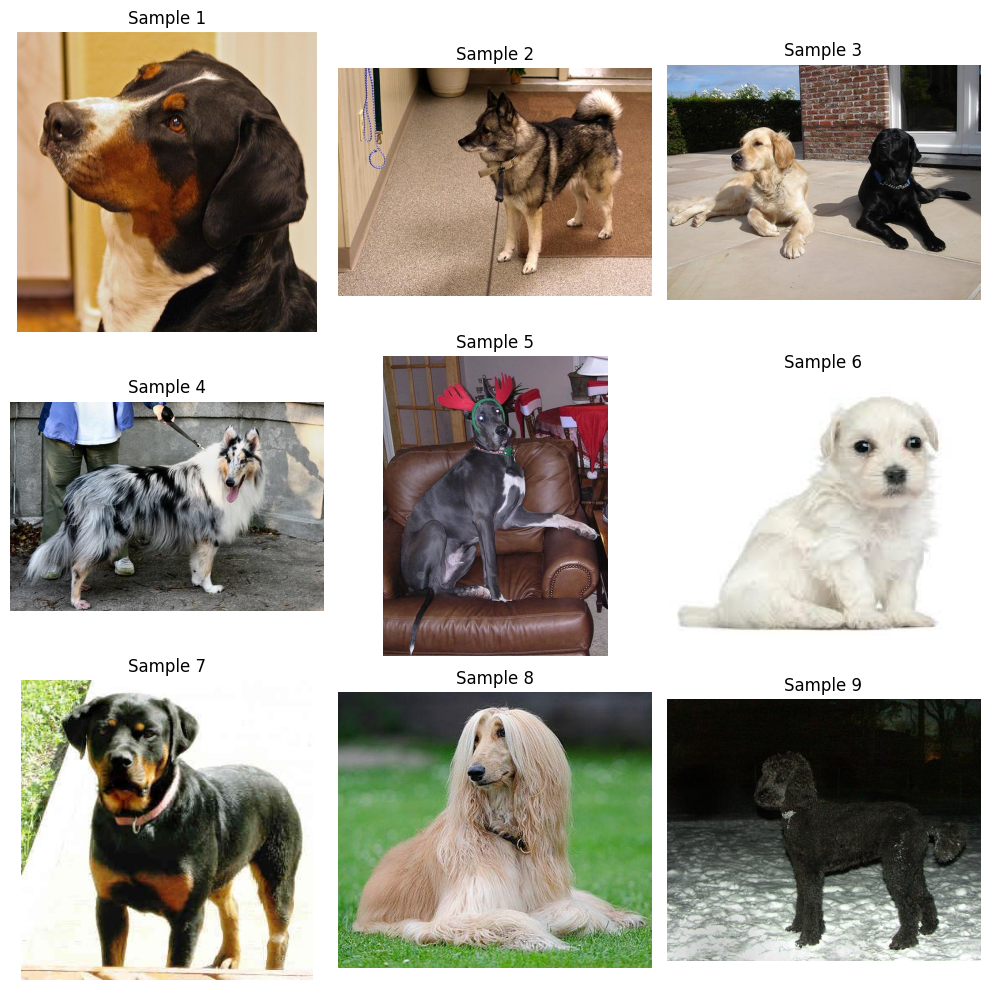

In [9]:
samples = dataset.take(9)

fig, axes = plt.subplots(3, 3, figsize=(10, 10))
axes = axes.ravel()

for idx, sample in enumerate(samples):
    img = plt.imread(sample.filepath)

    axes[idx].imshow(img)
    axes[idx].axis('off')
    axes[idx].set_title(f"Sample {idx+1}")

plt.tight_layout()
plt.show()

In [10]:
heights_list = []
width_list = []

for sample in dataset:
    heights_list.append(sample.metadata.height)
    width_list.append(sample.metadata.width)

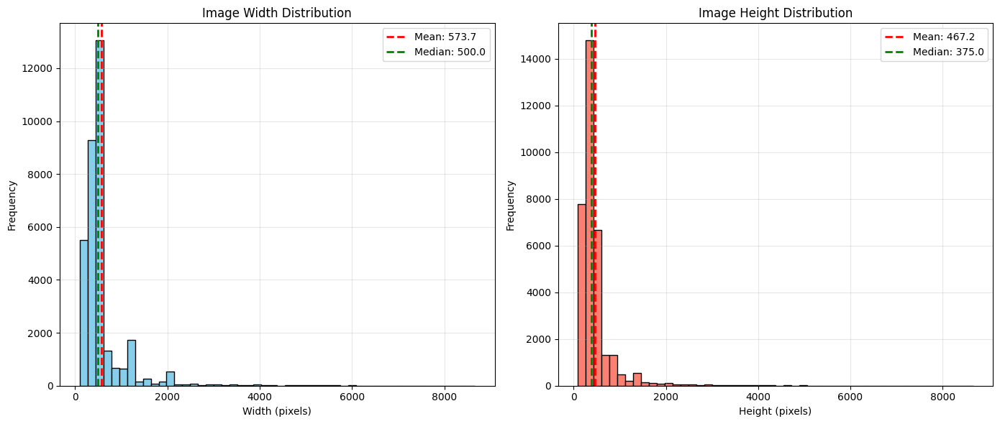

In [11]:
width_mean = np.mean(width_list)
width_median = np.median(width_list)
height_mean = np.mean(heights_list)
height_median = np.median(heights_list)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Plot width distribution
ax1.hist(width_list, bins=50, color='skyblue', edgecolor='black')
ax1.axvline(width_mean, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {width_mean:.1f}')
ax1.axvline(width_median, color='green', linestyle='dashed', linewidth=2, label=f'Median: {width_median:.1f}')
ax1.set_title('Image Width Distribution')
ax1.set_xlabel('Width (pixels)')
ax1.set_ylabel('Frequency')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Plot height distribution
ax2.hist(heights_list, bins=50, color='salmon', edgecolor='black')
ax2.axvline(height_mean, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {height_mean:.1f}')
ax2.axvline(height_median, color='green', linestyle='dashed', linewidth=2, label=f'Median: {height_median:.1f}')
ax2.set_title('Image Height Distribution')
ax2.set_xlabel('Height (pixels)')
ax2.set_ylabel('Frequency')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

По графикам видно, что есть изображения, у которых очень большое разрешение (> 8000), в дальнейшем они будут сжиматься до 1920 по ширине, чтобы сэкономить память на хранение данных